# Automated Air-Liquid Interface Cell Culture Analysis Using Deep Optical Flow

## Autogenerated Report: RAINBOW Air-Liquid Interface Cell Culture Analysis
#### Website: https://github.com/AlphonsGwatimba/Automated-Air-Liquid-Interface-Cell-Culture-Analysis-Using-Deep-Optical-Flow

In [1]:
# %matplotlib widget

import json
import os
from collections import defaultdict

import cv2

from IPython.display import Image, Video

import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow 

import pandas as pd

import rainbow
from rainbow.data_analysis import (gen_base_metrics, dirn_scatter,
                                   mag_scatter, save_stats,
                                   save_quiver_plots, save_heatmaps)
from rainbow.optical_flow.optical_flow import flow_to_img
from rainbow.util import (cleanup_dir, comb_imgs, load_optical_flow, load_std_imgs, 
                          save_video, save_img_ser, video_reshape)

import yaml

VID_FILENAME = 'Video'

## Source directory

In [2]:
curr_dir = os.getcwd()
print(curr_dir)

C:\Users\Alphons\OneDrive\Documents\Automated-Air-Liquid-Interface-Cell-Culture-Analysis-Using-Deep-Optical-Flow\examples\example_image_series\(tif)_191018_HNA-ALI_d14.nd2 - 191018_HNA-ALI_d14.nd2 (series 03)0000_etc


## Image Series Type

In [3]:
# Load metadata
with open(f'{rainbow.METADATA_FILENAME}.json') as f:
    metadata = json.load(f)
    
print(metadata['type'])

.tif


## RAINBOW Analysis Timestamp

In [4]:
print(metadata['analysis_timestamp'])

26 October 2021, 22:24:30


## Image Series Metadata

In [5]:
print(json.dumps(metadata, sort_keys=True, indent=4))

{
    "analysis_timestamp": "26 October 2021, 22:24:30",
    "calibration_um": 0.31302569743655434,
    "dir": "C:\\Users\\Alphons\\OneDrive\\Documents\\Automated-Air-Liquid-Interface-Cell-Culture-Analysis-Using-Deep-Optical-Flow\\examples\\example_image_series",
    "type": ".tif"
}


In [6]:
data = defaultdict(list)
flow_path = rainbow.OPTICAL_FLOW_FILENAME
data['preds'] = load_optical_flow(flow_path)
data['raw_imgs'] = load_std_imgs(rainbow.RAW_IMGS_DIR_NAME, 
                                 metadata['calibration_um'])
gen_base_metrics(data)
for key, unit, filename in zip(['mag_stats', 'dirn_stats'], ['um', 'deg'], 
        [rainbow.MAG_STATS_FILENME, rainbow.DIRN_STATS_FILENME]):
    save_stats(data[key], os.path.join(f'{filename}.csv'), unit)

## Magnitude Statistics

In [7]:
df = pd.read_csv(f'{rainbow.MAG_STATS_FILENME}.csv', sep=',')
print(df)

    frame  min (um)  max (um)  mean (um)  std (um)  var (um)
0       0  0.001922  4.178232   2.138720  0.771738  0.595579
1       1  0.001548  3.935667   2.059078  0.799700  0.639520
2       2  0.102884  4.091494   2.039340  0.814543  0.663481
3       3  0.003528  3.479420   1.967105  0.759979  0.577568
4       4  0.004041  3.422691   1.889933  0.741849  0.550339
5       5  0.001328  3.128321   1.746436  0.634321  0.402363
6       6  0.005252  3.086466   1.701845  0.645827  0.417092
7       7  0.004326  3.372862   1.699563  0.644477  0.415350
8       8  0.002674  3.382968   1.754328  0.715596  0.512077
9       9  0.002631  3.494042   1.703855  0.734561  0.539580
10     10  0.003292  3.258859   1.729070  0.700330  0.490462
11     11  0.001937  3.233230   1.721925  0.726743  0.528155
12     12  0.000836  3.261819   1.664737  0.703804  0.495340
13     13  0.001781  3.125801   1.658645  0.718937  0.516871
14     14  0.002709  3.131471   1.644901  0.714538  0.510565
15     15  0.005130  3.3

## Direction Statistics

In [8]:
df = pd.read_csv(f'{rainbow.DIRN_STATS_FILENME}.csv', sep=',')
print(df)

    frame  min (deg)   max (deg)  mean (deg)   std (deg)     var (deg)
0       0   0.000041  359.999969  133.610109  128.092768  16407.757174
1       1   0.000414  359.999176  164.277630  135.725948  18421.533076
2       2   0.000021  359.999939  159.914149  131.683018  17340.417239
3       3   0.000308  359.999969  173.200850  133.874284  17922.323931
4       4   0.000931  359.999969  179.036407  130.140860  16936.643322
5       5   0.000555  360.000000  185.557691  120.939087  14626.262696
6       6   0.000189  359.999969  183.715416  116.998012  13688.534733
7       7   0.000036  359.999969  185.182895  119.741593  14338.049178
8       8   0.000118  360.000000  178.595031  122.222393  14938.313381
9       9   0.000309  359.999481  188.693792  117.707661  13855.093525
10     10   0.000064  359.999908  169.252950  118.658778  14079.905490
11     11   0.000063  359.999847  188.900092  118.886045  14133.891712
12     12   0.000106  359.999481  180.445115  116.100332  13479.287025
13    

## Magnitude Scatter Plot

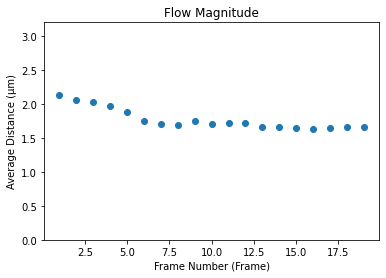

In [9]:
mag_scatter([s['mean'] for s in data['mag_stats']])

In [10]:
dpi = 1000
plt.savefig(f'{rainbow.MAG_SCATTER_FILENAME}.png', dpi=dpi)

<Figure size 432x288 with 0 Axes>

## Direction Scatter Plot

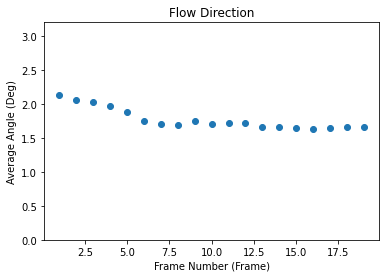

In [11]:
dirn_scatter([s['mean'] for s in data['mag_stats']])

In [12]:
plt.savefig(f'{rainbow.MAG_SCATTER_FILENAME}.png', dpi=dpi)

<Figure size 432x288 with 0 Axes>

In [13]:
data['flow_imgs'] = [flow_to_img(pred) for pred in data['preds']]
data['comb_imgs'] = [comb_imgs(img1, img2) for img1, img2 in zip(
                     data['raw_imgs'], data['flow_imgs'])]

for dir_name, imgs in zip([rainbow.FLOW_IMGS_DIR_NAME, rainbow.COMB_IMGS_DIR_NAME], 
                          [data['flow_imgs'], data['comb_imgs']]):
    img_ser_dir = os.path.join(curr_dir, dir_name)
    cleanup_dir(img_ser_dir)
    os.mkdir(img_ser_dir)  # already exists?
    save_img_ser(imgs, img_ser_dir, False)
    save_video(img_ser_dir, os.path.join(img_ser_dir, VID_FILENAME))

## Raw Image Series (left) and RAINBOW Optical Flow Visualisation (Right)

In [14]:
vid_path = os.path.join(rainbow.COMB_IMGS_DIR_NAME, VID_FILENAME + rainbow.util.VID_FILE_EXT)  
dsp_wdh, dsp_hgt = video_reshape(vid_path, 1000)
Video(vid_path, embed=True, width=dsp_wdh, height=dsp_hgt, html_attributes='controls loop')

a) The direction of motion at any position within RAINBOW generated optical flow images is measured clockwise from the initial horizontal position of a unit circle (left) and is shown using hue values (right). 

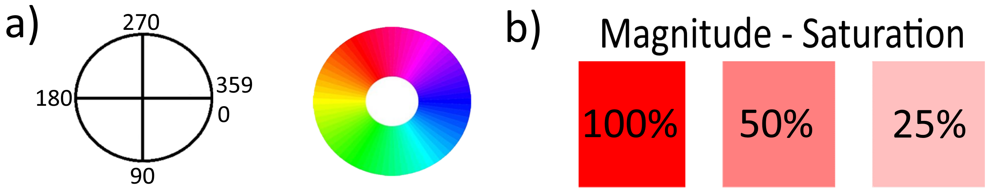

In [15]:
cleanup_dir(rainbow.HEATMAPS_DIR_NAME)
cleanup_dir(rainbow.QUIVER_PLOTS_DIR_NAME)
os.mkdir(rainbow.HEATMAPS_DIR_NAME)
os.mkdir(rainbow.QUIVER_PLOTS_DIR_NAME)
plt.ioff()
save_heatmaps(data['preds'], rainbow.HEATMAPS_DIR_NAME)
save_quiver_plots(data['preds'], rainbow.QUIVER_PLOTS_DIR_NAME)
plt.close()

## Magnitude Heatmaps Across Image Series

Visualization of motion magnitiude using heatmap with hot colour mapping.

In [16]:
vid_path = os.path.join(rainbow.HEATMAPS_DIR_NAME, VID_FILENAME)  
save_video(rainbow.HEATMAPS_DIR_NAME, vid_path, 5)
vid_path += rainbow.util.VID_FILE_EXT
dsp_wdh, dsp_hgt = video_reshape(vid_path, 640)
Video(vid_path, embed=True, width=dsp_wdh, height=dsp_hgt, html_attributes='controls loop')

## Quiver Plots Across Image Series

Visualisation of optical flow using quiver plots containing vector arrows.

In [17]:
vid_path = os.path.join(rainbow.QUIVER_PLOTS_DIR_NAME, VID_FILENAME)  
save_video(rainbow.QUIVER_PLOTS_DIR_NAME, vid_path, 5) 
vid_path += rainbow.util.VID_FILE_EXT
dsp_wdh, dsp_hgt = video_reshape(vid_path, 640)
Video(vid_path, embed=True, width=dsp_wdh, height=dsp_hgt, html_attributes='controls loop')